In [0]:
## Place this cell in any team notebook that needs access to the team cloud storage.


# The following blob storage is accessible to team members only (read and write)
# access key is valid til TTL
# after that you will need to create a new SAS key and authenticate access again via DataBrick command line
blob_container  = "final-project-summer24-team3"       # The name of your container created in https://portal.azure.com
storage_account = "summer2024team3"  # The name of your Storage account created in https://portal.azure.com
secret_scope    = "summer24_team_3_2_scope"           # The name of the scope created in your local computer using the Databricks CLI
secret_key      = "final-project-summer24-team3"             # The name of the secret key created in your local computer using the Databricks CLI
team_blob_url   = f"wasbs://{blob_container}@{storage_account}.blob.core.windows.net"  #points to the root of your team storage bucket


# the 261 course blob storage is mounted here.
mids261_mount_path      = "/mnt/mids-w261"

# SAS Token: Grant the team limited access to Azure Storage resources
spark.conf.set(
  f"fs.azure.sas.{blob_container}.{storage_account}.blob.core.windows.net",
  dbutils.secrets.get(scope = secret_scope, key = secret_key)
)

data_BASE_DIR = f"{team_blob_url}/TP"

files = dbutils.fs.ls(data_BASE_DIR)
display(files)

path,name,size,modificationTime
wasbs://final-project-summer24-team3@summer2024team3.blob.core.windows.net/TP/_SUCCESS,_SUCCESS,0,1720561571000
wasbs://final-project-summer24-team3@summer2024team3.blob.core.windows.net/TP/_committed_1002670972388615845,_committed_1002670972388615845,625,1720560531000
wasbs://final-project-summer24-team3@summer2024team3.blob.core.windows.net/TP/_committed_5669257934384103852,_committed_5669257934384103852,221,1720561571000
wasbs://final-project-summer24-team3@summer2024team3.blob.core.windows.net/TP/_committed_6618439955609603938,_committed_6618439955609603938,419,1720561337000
wasbs://final-project-summer24-team3@summer2024team3.blob.core.windows.net/TP/_committed_9167039456723159873,_committed_9167039456723159873,318,1720559468000
wasbs://final-project-summer24-team3@summer2024team3.blob.core.windows.net/TP/_committed_vacuum825530481471543349,_committed_vacuum825530481471543349,95,1720561338000
wasbs://final-project-summer24-team3@summer2024team3.blob.core.windows.net/TP/_started_1002670972388615845,_started_1002670972388615845,0,1720560531000
wasbs://final-project-summer24-team3@summer2024team3.blob.core.windows.net/TP/_started_5669257934384103852,_started_5669257934384103852,0,1720561570000
wasbs://final-project-summer24-team3@summer2024team3.blob.core.windows.net/TP/_started_6618439955609603938,_started_6618439955609603938,0,1720561337000
wasbs://final-project-summer24-team3@summer2024team3.blob.core.windows.net/TP/df_1y_cleaned_transformed/,df_1y_cleaned_transformed/,0,1722046865000


In [0]:
from pyspark.sql.functions import col, concat_ws, lpad, expr, unix_timestamp, from_unixtime, when, count, lag, greatest
import pyspark.sql.functions as F
from pyspark.sql.window import Window
from pyspark.sql.types import IntegerType, StringType, DoubleType
from datetime import datetime, timedelta
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pyspark.ml.feature import Bucketizer
from pyspark.ml.stat import Correlation
from pyspark.ml.feature import VectorAssembler

In [0]:
# Full Dataset before down sampling
data_full = spark.read.parquet(f'{data_BASE_DIR}/flight_stations_weather_all_cleaned2/')

In [0]:
data_full.columns

['index',
 'MONTH',
 'DAY_OF_WEEK',
 'OP_CARRIER',
 'ORIGIN_AIRPORT_ID',
 'CRS_DEP_TIME',
 'DISTANCE',
 'DEP_DEL15',
 'QUARTER',
 'DEP_DELAY',
 'DEST_AIRPORT_ID',
 'FL_DATE',
 'TAIL_NUM',
 'ARR_TIME',
 'ARR_DELAY',
 'ARR_DEL15',
 'CANCELLED',
 'type',
 'ELEVATION',
 'HourlyAltimeterSetting',
 'HourlyDryBulbTemperature',
 'HourlyPrecipitation',
 'HourlyRelativeHumidity',
 'HourlySkyConditions',
 'HourlySeaLevelPressure',
 'HourlyVisibility',
 'HourlyWindDirection',
 'HourlyWindSpeed',
 'HourlyPresentWeatherType',
 'HOUR',
 'MONTH_indexed',
 'MONTH_vec',
 'DAY_OF_WEEK_indexed',
 'DAY_OF_WEEK_vec',
 'OP_CARRIER_indexed',
 'OP_CARRIER_vec',
 'ORIGIN_AIRPORT_ID_indexed',
 'ORIGIN_AIRPORT_ID_vec',
 'HOUR_indexed',
 'HOUR_vec',
 'type_indexed',
 'type_vec',
 'HourlySkyConditions_vec',
 'HourlyPresentWeatherType_vec',
 'Rain',
 'Snow',
 'Thunder',
 'Tornado',
 'View Obstruction',
 'MONTH_1',
 'MONTH_2',
 'MONTH_3',
 'MONTH_4',
 'MONTH_5',
 'MONTH_6',
 'MONTH_7',
 'MONTH_8',
 'MONTH_9',
 'MONTH

In [0]:
display(data_full)

index,MONTH,DAY_OF_WEEK,OP_CARRIER,ORIGIN_AIRPORT_ID,CRS_DEP_TIME,DISTANCE,DEP_DEL15,QUARTER,DEP_DELAY,DEST_AIRPORT_ID,FL_DATE,TAIL_NUM,ARR_TIME,ARR_DELAY,ARR_DEL15,CANCELLED,type,ELEVATION,HourlyAltimeterSetting,HourlyDryBulbTemperature,HourlyPrecipitation,HourlyRelativeHumidity,HourlySkyConditions,HourlySeaLevelPressure,HourlyVisibility,HourlyWindDirection,HourlyWindSpeed,HourlyPresentWeatherType,HOUR,MONTH_indexed,MONTH_vec,DAY_OF_WEEK_indexed,DAY_OF_WEEK_vec,OP_CARRIER_indexed,OP_CARRIER_vec,ORIGIN_AIRPORT_ID_indexed,ORIGIN_AIRPORT_ID_vec,HOUR_indexed,HOUR_vec,type_indexed,type_vec,HourlySkyConditions_vec,HourlyPresentWeatherType_vec,Rain,Snow,Thunder,Tornado,View Obstruction,MONTH_1,MONTH_2,MONTH_3,MONTH_4,MONTH_5,MONTH_6,MONTH_7,MONTH_8,MONTH_9,MONTH_10,MONTH_11,MONTH_12,HOUR_00,HOUR_01,HOUR_02,HOUR_03,HOUR_04,HOUR_05,HOUR_06,HOUR_07,HOUR_08,HOUR_09,HOUR_10,HOUR_11,HOUR_12,HOUR_13,HOUR_14,HOUR_15,HOUR_16,HOUR_17,HOUR_18,HOUR_19,HOUR_20,HOUR_21,HOUR_22,HOUR_23,DAY_OF_WEEK_1,DAY_OF_WEEK_2,DAY_OF_WEEK_3,DAY_OF_WEEK_4,DAY_OF_WEEK_5,DAY_OF_WEEK_6,DAY_OF_WEEK_7,OP_CARRIER_9E,OP_CARRIER_AA,OP_CARRIER_AS,OP_CARRIER_B6,OP_CARRIER_DL,OP_CARRIER_EV,OP_CARRIER_F9,OP_CARRIER_G4,OP_CARRIER_HA,OP_CARRIER_MQ,OP_CARRIER_NK,OP_CARRIER_OH,OP_CARRIER_OO,OP_CARRIER_QX,OP_CARRIER_UA,OP_CARRIER_US,OP_CARRIER_VX,OP_CARRIER_WN,OP_CARRIER_YV,OP_CARRIER_YX,type_large_airport,type_medium_airport,type_seaplane_base,type_small_airport,DEP_12hr,DEP_6hr,DEP_4hr,ARR_12hr,ARR_6hr,ARR_4hr,DISTANCE_LAG,REALIZED_DELAY_MIN,REALIZED_DEL15
40891820,1,4,F9,13930,600,1197.0,1.0,1,null,13303,2015-01-01,null,null,null,1.0,1.0,large_airport,201.8,30.02,14.0,0.0,67.0,CLR:00,30.06,10.0,240.0,14.0,null,06,6.0,"Map(vectorType -> sparse, length -> 11, indices -> List(6), values -> List(1.0))",2.0,"Map(vectorType -> sparse, length -> 6, indices -> List(2), values -> List(1.0))",13.0,"Map(vectorType -> sparse, length -> 19, indices -> List(13), values -> List(1.0))",1.0,"Map(vectorType -> sparse, length -> 372, indices -> List(1), values -> List(1.0))",0.0,"Map(vectorType -> sparse, length -> 23, indices -> List(0), values -> List(1.0))",0.0,"Map(vectorType -> sparse, length -> 3, indices -> List(0), values -> List(1.0))","Map(vectorType -> sparse, length -> 269, indices -> List(260), values -> List(1.0))",null,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0,null,null,0
25708554,1,4,F9,13486,600,679.0,1.0,1,null,11292,2015-01-01,null,null,null,1.0,1.0,medium_airport,972.9,30.38,0.0,0.0,83.0,CLR:00,30.6,9.0,0.0,0.0,null,06,6.0,"Map(vectorType -> sparse, length -> 11, indices -> List(6), values -> List(1.0))",2.0,"Map(vectorType -> sparse, length -> 6, indices -> List(2), values -> List(1.0))",13.0,"Map(vectorType -> sparse, length -> 19, indices -> List(13), values -> List(1.0))",153.0,"Map(vectorType -> sparse, length -> 372, indices -> List(153), values -> List(1.0))",0.0,"Map(vectorType -> sparse, length -> 23, indices -> List(0), values -> List(1.0))",1.0,"Map(vectorType -> sparse, length -> 3, indices -> List(1), values -> List(1.0))","Map(vectorType -> sparse, length -> 269, indices -> List(260), values -> List(1.0))",null,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0.0,0.0,0.0,0.0,0.0,0.0,1197.0,-120.0,0
12360317,1,4,UA,12892,845,2556.0,1.0,1,null,12173,2015-01-01,null,null,null,1.0,1.0,large_airport,29.6,30.13,37.0,0.0,59.0,FEW:02 45 SCT:04 160,30.13,10.0,80.0,0.0,null,08,6.0,"Map(vectorType -> sparse, length -> 11, indices -> List(6), values -> List(1.0))",2.0,"Map(vectorType -> sparse, length -> 6, indices -> List(2), values -> List(1.0))",4.0,"Map(vectorType -> sparse, length -> 19, indices -> List(4), values -> List(1.0))",4.0,"Map(vectorType -> sparse, length -> 372, indices -> List(4), values -> List(1.0))",2.0,"Map(vectorType -> sparse, lengt

## Data Size

In [0]:
data_with_year = data_full.withColumn('year', F.year("FL_DATE"))

In [0]:
years = data_with_year.select("year").distinct().sort("year").collect()
years

[Row(year=2015),
 Row(year=2016),
 Row(year=2017),
 Row(year=2018),
 Row(year=2019),
 Row(year=2020),
 Row(year=2021)]

In [0]:
total_rows = data_full.count()
print(f"Total rows in all data: {total_rows:,}")

Total rows in all data: 41,482,001


In [0]:
rows_per_year = data_with_year.groupBy("year").count().orderBy("year")
print(f"Years in data: {[row.year for row in years]}")
rows_per_year.show()


Years in data: [2015, 2016, 2017, 2018, 2019, 2020, 2021]
+----+-------+
|year|  count|
+----+-------+
|2015|5682558|
|2016|5478687|
|2017|5535359|
|2018|7069964|
|2019|7270542|
|2020|4597426|
|2021|5847465|
+----+-------+



In [0]:
eda_data = data_full.filter(F.year("FL_DATE").between(2015, 2018))
# create a 10% sample for testing viz before applying to full eda_data
sample_df = eda_data.sample(fraction=0.1, seed=42)

print(f"eda_data count: {eda_data.count()}")
print(f"sample_df count: {sample_df.count()}")

eda_data count: 23766568
sample_df count: 2377797


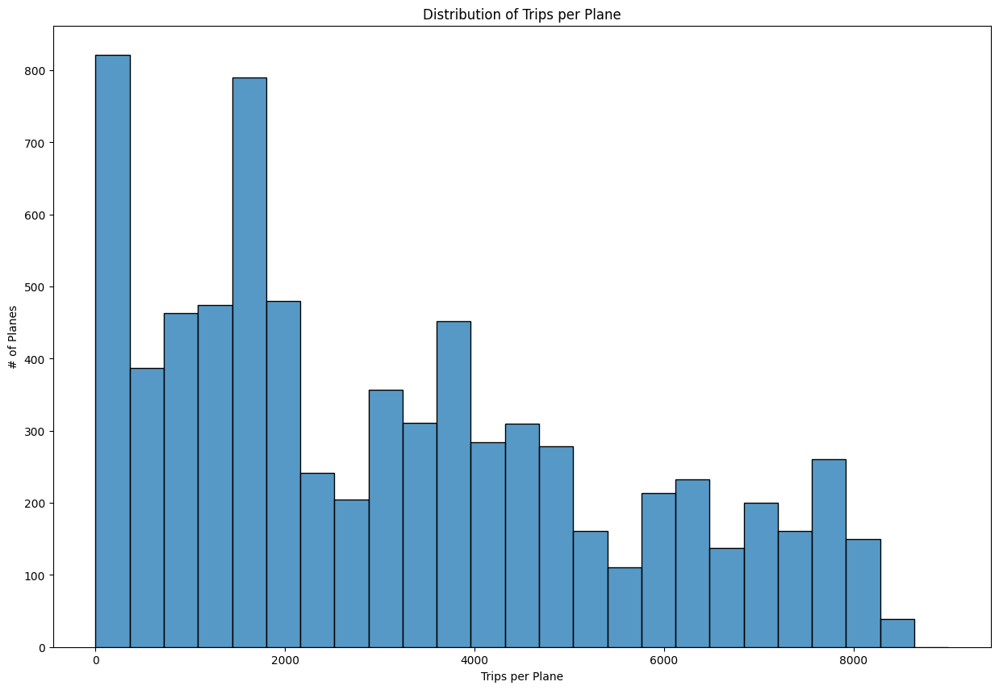

In [0]:
tail_num_dist = eda_data.groupby("TAIL_NUM").count().orderBy("count").toPandas()
plt.figure(figsize=(15, 10))

sns.histplot(data=tail_num_dist, x="count", binrange=[0,9000])\
  .set(title='Distribution of Trips per Plane', ylabel='# of Planes', xlabel='Trips per Plane')

plt.show()

## Correlation Matrix

In [0]:
del_lag_filter = sample_df.withColumn("DELAY_PER_MILE", col("REALIZED_DELAY_MIN")/col("DISTANCE_LAG"))\
    .dropna(subset=["REALIZED_DELAY_MIN","DISTANCE_LAG"])
min_value = del_lag_filter.agg(F.min("DEP_DELAY")).collect()[0][0]

print(min_value)

-234.0


In [0]:
rdm_quantiles = del_lag_filter.approxQuantile("REALIZED_DELAY_MIN", [0.2, 0.4, 0.6, 0.8, 1.0], 0.01)
def rdm_assign_quantile_bin(value):
    for i in range(len(rdm_quantiles)):
        if value <= rdm_quantiles[i]:
            return i
    return len(rdm_quantiles)  

assign_rdm_quantile_bin_udf = udf(rdm_assign_quantile_bin, IntegerType())

del_lag_filter = del_lag_filter.withColumn("RDM_quantile", assign_rdm_quantile_bin_udf(col("REALIZED_DELAY_MIN")))
dl_quantiles = del_lag_filter.approxQuantile("DISTANCE_LAG", [0.2, 0.4, 0.6, 0.8, 1.0], 0.01)

In [0]:
def dl_assign_quantile_bin(value):
    for i in range(len(dl_quantiles)):
        if value <= dl_quantiles[i]:
            return i
    return len(dl_quantiles)  

assign_dl_quantile_bin_udf = udf(dl_assign_quantile_bin, IntegerType())

del_lag_filter = del_lag_filter.withColumn("DL_quantile", assign_dl_quantile_bin_udf(col("DISTANCE_LAG")))

total = del_lag_filter.count()
total_delays = del_lag_filter.filter(col("DEP_DEL15") > 0).count()

del_lag_matrix = del_lag_filter.groupBy("RDM_quantile","DL_quantile")\
.agg((F.sum("DEP_DEL15")/F.count("*")).alias('delay_pct'),\
    (F.count("*")).alias('total_flights'),F.sum("DEP_DEL15").alias('total_delays')\
    ).toPandas()

del_lag_matrix['total_flights'] = 1.0*del_lag_matrix['total_flights']/total
del_lag_matrix['total_delays'] = 1.0*del_lag_matrix['total_delays']/total_delays

### Test: Do NOT use

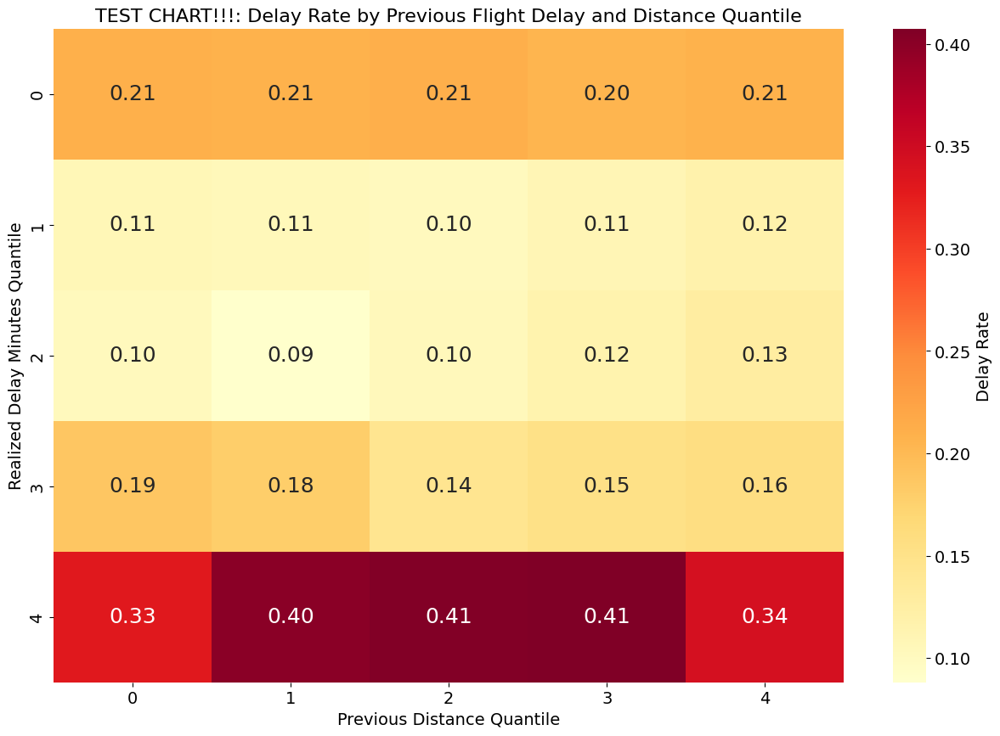

In [0]:

tick_sizes = 16

delay_matrix = del_lag_matrix.pivot(index='RDM_quantile', columns='DL_quantile', values='delay_pct')

plt.figure(figsize=(15, 10))
heatmap = sns.heatmap(delay_matrix, cmap='YlOrRd', annot=True, fmt='.2f', cbar_kws={'label': 'Delay Rate'},
                      annot_kws={'size': 18})

heatmap.set_ylabel('Realized Delay Minutes Quantile',fontsize=14)
heatmap.set_xlabel('Previous Distance Quantile',fontsize=14)
heatmap.set_title('TEST CHART!!!: Delay Rate by Previous Flight Delay and Distance Quantile',fontsize=16)

heatmap.tick_params(axis='x', labelsize=14)
heatmap.tick_params(axis='y', labelsize=14)

# Adjusting the font size for the colorbar label
colorbar = heatmap.collections[0].colorbar
colorbar.ax.tick_params(labelsize=14)
colorbar.set_label('Delay Rate', fontsize=14)

plt.show()

### Actual EDA Data Chart

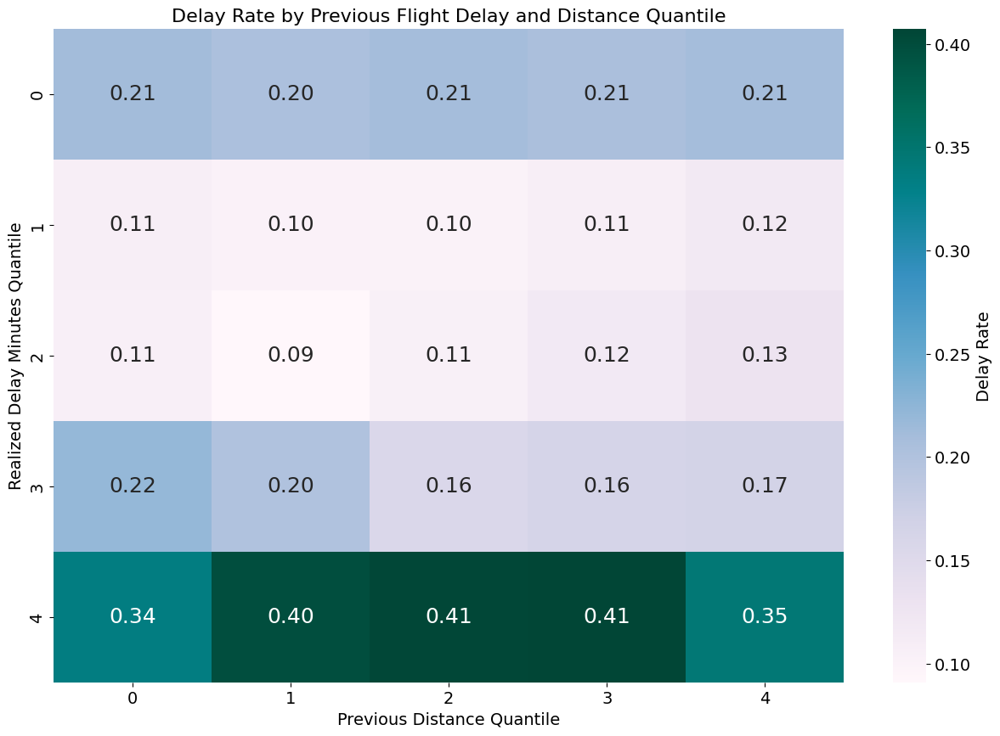

In [0]:
del_lag_filter = eda_data.withColumn("DELAY_PER_MILE", col("REALIZED_DELAY_MIN")/col("DISTANCE_LAG"))\
    .dropna(subset=["REALIZED_DELAY_MIN","DISTANCE_LAG"])
min_value = del_lag_filter.agg(F.min("DEP_DELAY")).collect()[0][0]

rdm_quantiles = del_lag_filter.approxQuantile("REALIZED_DELAY_MIN", [0.2, 0.4, 0.6, 0.8, 1.0], 0.01)
def rdm_assign_quantile_bin(value):
    for i in range(len(rdm_quantiles)):
        if value <= rdm_quantiles[i]:
            return i
    return len(rdm_quantiles)  

assign_rdm_quantile_bin_udf = udf(rdm_assign_quantile_bin, IntegerType())

del_lag_filter = del_lag_filter.withColumn("RDM_quantile", assign_rdm_quantile_bin_udf(col("REALIZED_DELAY_MIN")))
dl_quantiles = del_lag_filter.approxQuantile("DISTANCE_LAG", [0.2, 0.4, 0.6, 0.8, 1.0], 0.01)

def dl_assign_quantile_bin(value):
    for i in range(len(dl_quantiles)):
        if value <= dl_quantiles[i]:
            return i
    return len(dl_quantiles)  

assign_dl_quantile_bin_udf = udf(dl_assign_quantile_bin, IntegerType())

del_lag_filter = del_lag_filter.withColumn("DL_quantile", assign_dl_quantile_bin_udf(col("DISTANCE_LAG")))

total = del_lag_filter.count()
total_delays = del_lag_filter.filter(col("DEP_DEL15") > 0).count()

del_lag_matrix = del_lag_filter.groupBy("RDM_quantile","DL_quantile")\
.agg((F.sum("DEP_DEL15")/F.count("*")).alias('delay_pct'),\
    (F.count("*")).alias('total_flights'),F.sum("DEP_DEL15").alias('total_delays')\
    ).toPandas()

del_lag_matrix['total_flights'] = 1.0*del_lag_matrix['total_flights']/total
del_lag_matrix['total_delays'] = 1.0*del_lag_matrix['total_delays']/total_delays


tick_sizes = 16

delay_matrix = del_lag_matrix.pivot(index='RDM_quantile', columns='DL_quantile', values='delay_pct')

plt.figure(figsize=(15, 10))
# new
cmap = sns.color_palette("PuBuGn", as_cmap=True) 
heatmap = sns.heatmap(delay_matrix, cmap=cmap, annot=True, fmt='.2f', cbar_kws={'label': 'Delay Rate'},
                      annot_kws={'size': 18})
# old
# heatmap = sns.heatmap(delay_matrix, cmap='YlOrRd', annot=True, fmt='.2f', cbar_kws={'label': 'Delay Rate'},
                    #   annot_kws={'size': 18})

heatmap.set_ylabel('Realized Delay Minutes Quantile',fontsize=14)
heatmap.set_xlabel('Previous Distance Quantile',fontsize=14)
heatmap.set_title('Delay Rate by Previous Flight Delay and Distance Quantile',fontsize=16)

heatmap.tick_params(axis='x', labelsize=14)
heatmap.tick_params(axis='y', labelsize=14)

# Adjusting the font size for the colorbar label
colorbar = heatmap.collections[0].colorbar
colorbar.ax.tick_params(labelsize=14)
colorbar.set_label('Delay Rate', fontsize=14)

plt.show()

<Axes: xlabel='DL_quantile', ylabel='RDM_quantile'>

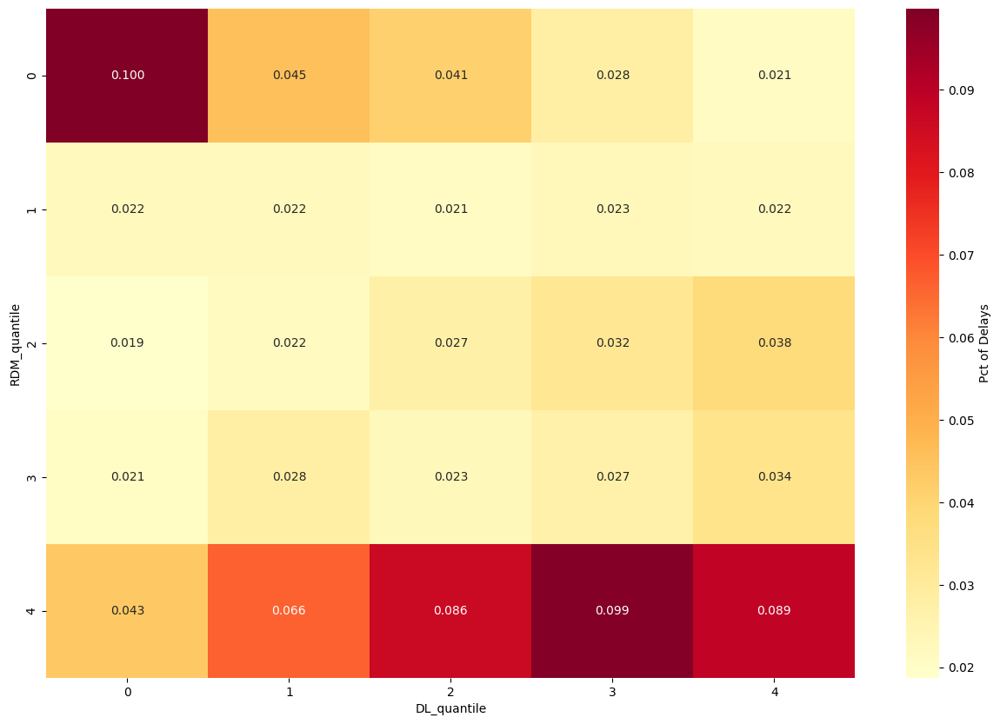

In [0]:
delay_matrix = del_lag_matrix.pivot(index='RDM_quantile', columns='DL_quantile', values='total_delays')

plt.figure(figsize=(15, 10))
sns.heatmap(delay_matrix, cmap='YlOrRd', annot=True, fmt='.3f', cbar_kws={'label': "Pct of Delays"})

<Axes: xlabel='DL_quantile', ylabel='RDM_quantile'>

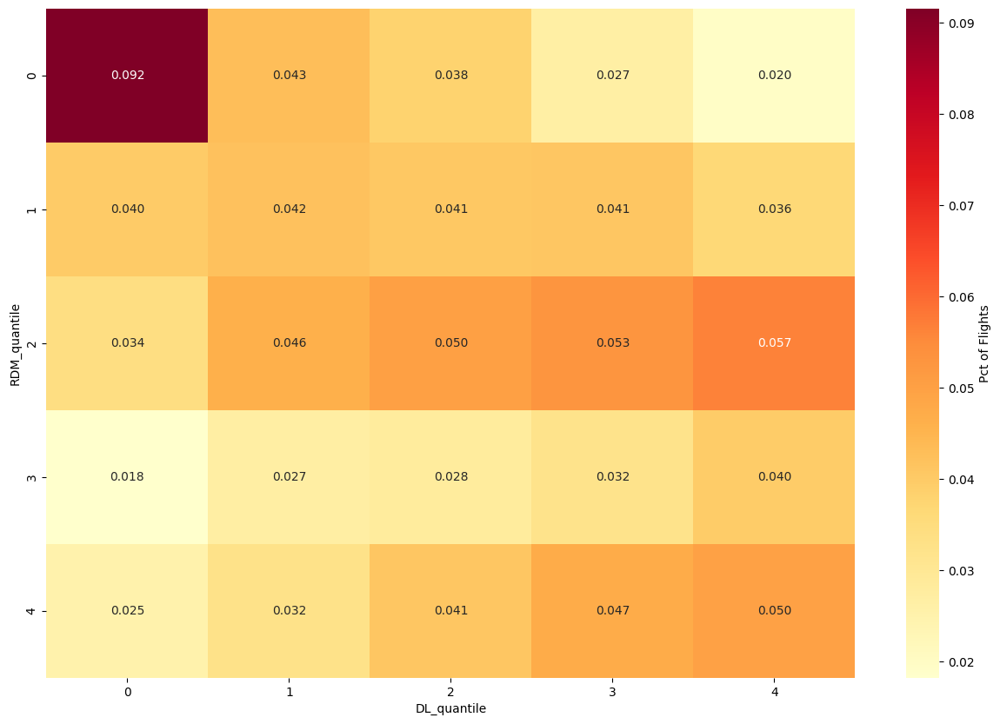

In [0]:


delay_matrix = del_lag_matrix.pivot(index='RDM_quantile', columns='DL_quantile', values='total_flights')

plt.figure(figsize=(15, 10))
sns.heatmap(delay_matrix, cmap='YlOrRd', annot=True, fmt='.3f', cbar_kws={'label': 'Pct of Flights'})

# JULIA EDA SECTION

In [0]:
def update_df_unixtime(df, timestring, datestring):
    """
    Inputs: dataframe, CRS_DEP_TIME, FL_DATE
    Outputs: dataframe with unix timestring
    """

    # Convert the military time to a time string
    df = df.withColumn("MOD_DEP_TIME", F.lpad(F.col(str(timestring)).cast("string"), 4, "0"))
    df = df.withColumn("MOD_DEP_TIME", F.concat_ws(":", df.MOD_DEP_TIME.substr(1, 2), df.MOD_DEP_TIME.substr(3, 2)))

    # Combine the date column with the time string to create a datetime string
    df = df.withColumn("MOD_DEP_DATE_TIME", F.concat_ws(" ", F.col(str(datestring)), F.col("MOD_DEP_TIME")))

    # maybe can experiment without casting and keeping it as a UNIX timestamp?
    # Convert the datetime string to a UNIX timestamp
    df = df.withColumn("DEP_TIMESTAMP_UNIX", F.unix_timestamp(F.col("MOD_DEP_DATE_TIME"), "yyyy-MM-dd HH:mm"))

#     # Convert the timestamp to a UNIX timestamp
#     df = df.withColumn("DEP_TIMESTAMP_UNIX", F.unix_timestamp(F.col("DEP_TIMESTAMP"), "yyyy-MM-dd HH:mm:ss"))

    df = df.drop("MOD_DEP_TIME") \
           .drop("MOD_DEP_DATE_TIME")


    return df


### Test Section

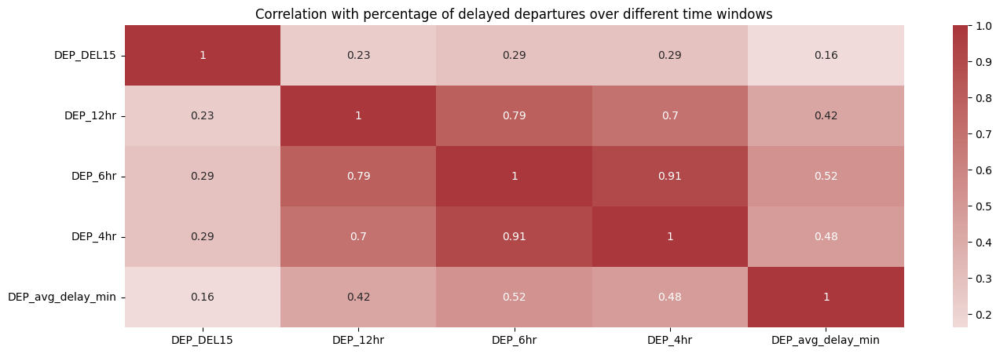

In [0]:
df = update_df_unixtime(sample_df, "CRS_DEP_TIME", "FL_DATE")
window_spec_6hr = Window.partitionBy("ORIGIN_AIRPORT_ID").orderBy("DEP_TIMESTAMP_UNIX").rangeBetween(Window.currentRow-(6 * 3600), Window.currentRow-(2 * 3600))
df = df.withColumn("DEP_avg_delay_min", F.avg("DEP_DELAY").over(window_spec_6hr))
dep_delay_df = df['DEP_DEL15', 'DEP_12hr', 'DEP_6hr', 'DEP_4hr', 'DEP_avg_delay_min'].dropna()


# convert to vector column first
vector_col = "corr_features"
assembler = VectorAssembler(inputCols=dep_delay_df.columns, outputCol=vector_col)
df_vector = assembler.transform(dep_delay_df).select(vector_col)

# get correlation matrix
matrix = Correlation.corr(df_vector, vector_col)
save_matrix = matrix.collect()[0][0] 
corr_matrix = save_matrix.toArray().tolist() 
corr_matrix_df = pd.DataFrame(data=corr_matrix, columns = dep_delay_df.columns, index=dep_delay_df.columns)

plt.figure(figsize=(16,5))  
sns.heatmap(corr_matrix_df, 
            xticklabels=corr_matrix_df.columns.values,
            yticklabels=corr_matrix_df.columns.values,  
            cmap="vlag", 
            center=0,
            annot=True)
plt.title("Correlation with percentage of delayed departures over different time windows")

plt.show()

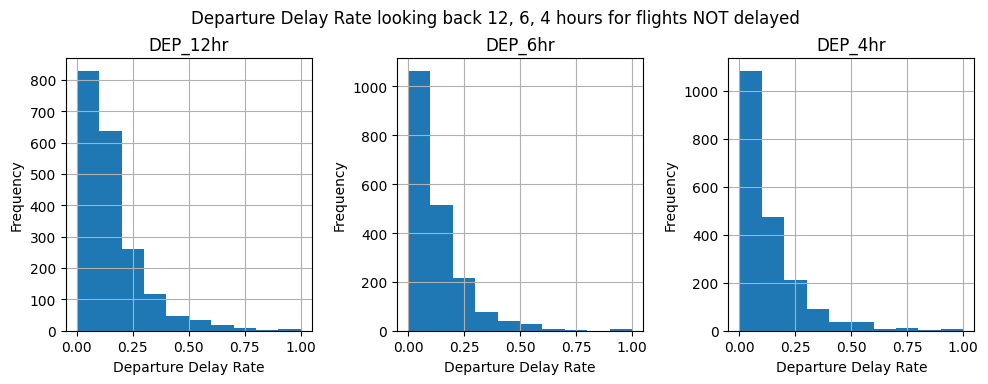

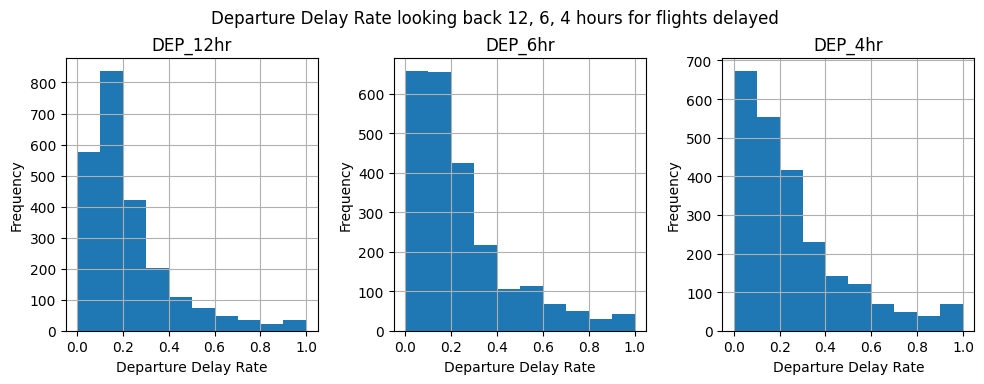

In [0]:
dep_delay_df = df['DEP_DEL15', 'DEP_12hr', 'DEP_6hr', 'DEP_4hr']
def plot_hist(df):
  hist1 = df.filter(df['DEP_DEL15']==0) \
            .select(df['DEP_12hr'], df['DEP_6hr'], df['DEP_4hr']) \
            .sample(withReplacement=False, fraction=0.001, seed=1) \
            .toPandas()
  hist2 = df.filter(df['DEP_DEL15']==1) \
            .select(df['DEP_12hr'], df['DEP_6hr'], df['DEP_4hr']) \
            .sample(withReplacement=False, fraction=0.005, seed=1) \
            .toPandas()
 
  ax1 = hist1.hist(figsize=(10, 4), layout=(1, 3))
  for ax in ax1.flatten():
      ax.set_xlabel("Departure Delay Rate")
      ax.set_ylabel("Frequency")
  plt.tight_layout(rect=[0, 0.03, 1, 0.95])
  plt.suptitle("Departure Delay Rate looking back 12, 6, 4 hours for flights NOT delayed")
  
  # Plot histograms for flights delayed
  ax2 = hist2.hist(figsize=(10, 4), layout=(1, 3))
  for ax in ax2.flatten():
      ax.set_xlabel("Departure Delay Rate")
      ax.set_ylabel("Frequency")
  plt.tight_layout(rect=[0, 0.03, 1, 0.95])
  plt.suptitle("Departure Delay Rate looking back 12, 6, 4 hours for flights delayed")
  
  # Show the plots
  plt.show()
plot_hist(dep_delay_df)

### Actual Chart Section

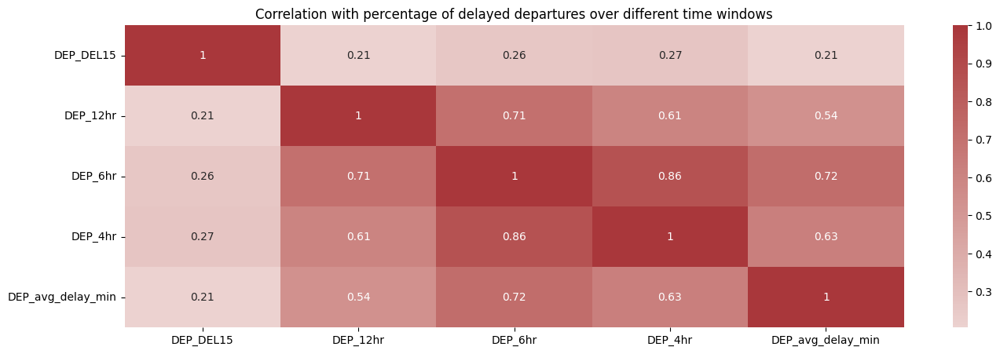

In [0]:
df = update_df_unixtime(eda_data, "CRS_DEP_TIME", "FL_DATE")
window_spec_6hr = Window.partitionBy("ORIGIN_AIRPORT_ID").orderBy("DEP_TIMESTAMP_UNIX").rangeBetween(Window.currentRow-(6 * 3600), Window.currentRow-(2 * 3600))
df = df.withColumn("DEP_avg_delay_min", F.avg("DEP_DELAY").over(window_spec_6hr))
dep_delay_df = df['DEP_DEL15', 'DEP_12hr', 'DEP_6hr', 'DEP_4hr', 'DEP_avg_delay_min'].dropna()


# convert to vector column first
vector_col = "corr_features"
assembler = VectorAssembler(inputCols=dep_delay_df.columns, outputCol=vector_col)
df_vector = assembler.transform(dep_delay_df).select(vector_col)

# get correlation matrix
matrix = Correlation.corr(df_vector, vector_col)
save_matrix = matrix.collect()[0][0] 
corr_matrix = save_matrix.toArray().tolist() 
corr_matrix_df = pd.DataFrame(data=corr_matrix, columns = dep_delay_df.columns, index=dep_delay_df.columns)

plt.figure(figsize=(16,5))  
sns.heatmap(corr_matrix_df, 
            xticklabels=corr_matrix_df.columns.values,
            yticklabels=corr_matrix_df.columns.values,  
            cmap="vlag", 
            center=0,
            annot=True)
plt.title("Correlation with percentage of delayed departures over different time windows")

plt.show()

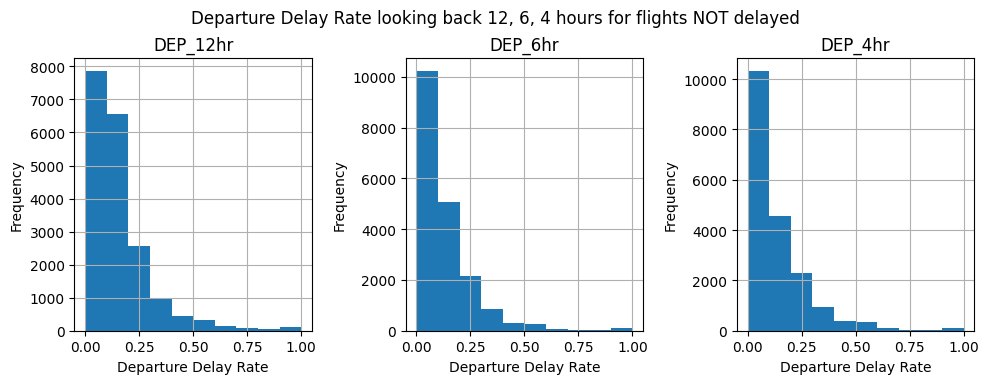

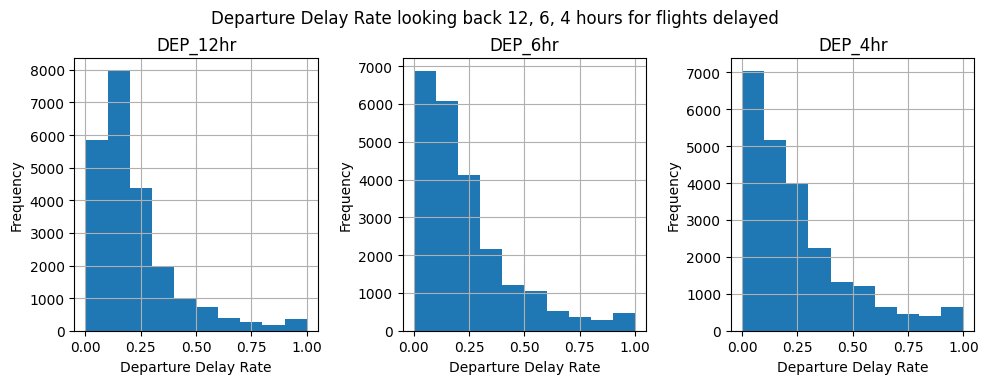

In [0]:
dep_delay_df = df['DEP_DEL15', 'DEP_12hr', 'DEP_6hr', 'DEP_4hr']
plot_hist(dep_delay_df)

## HISHAM EDA

In [0]:
df = eda_data

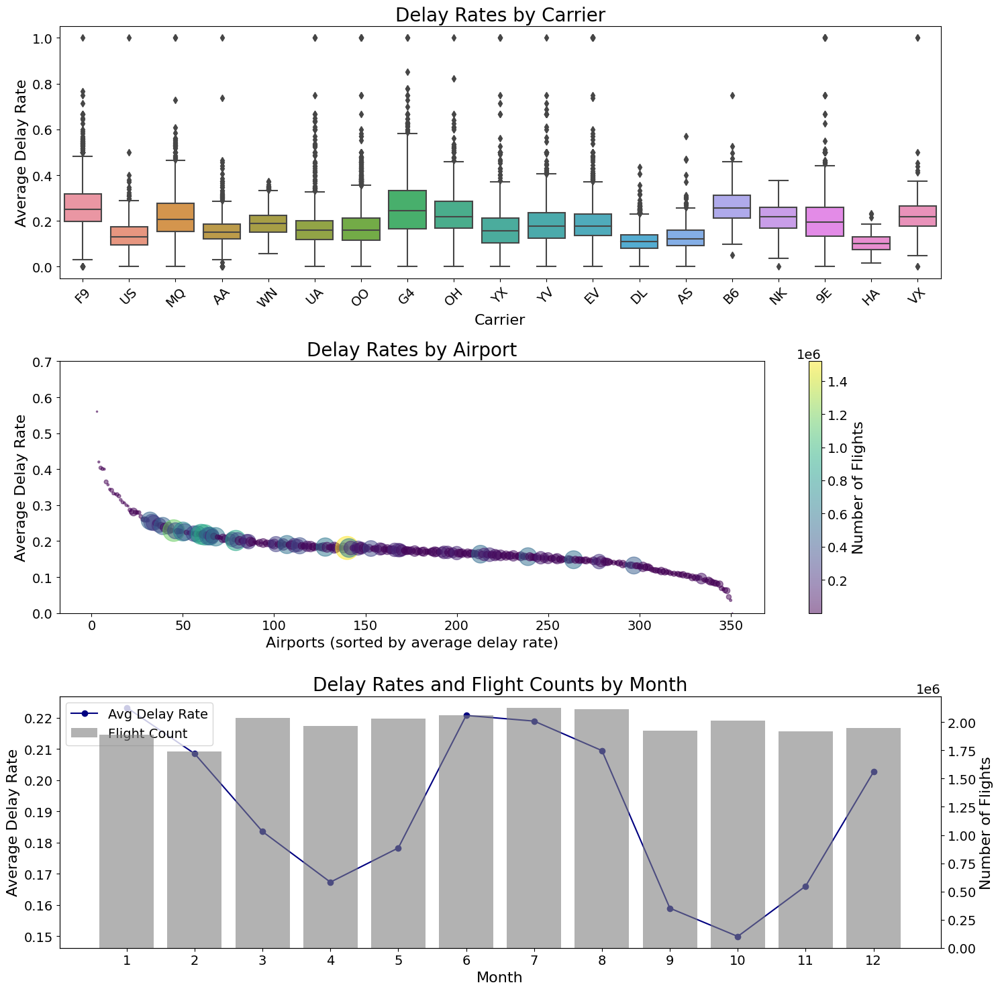

In [0]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import matplotlib.font_manager as font_manager

# Increase the default font size
plt.rcParams.update({'font.size': 14})


origin_airport_delays = eda_data.groupBy("ORIGIN_AIRPORT_ID").agg(F.avg("DEP_DEL15").alias("avg_delay_rate")).orderBy(F.desc("avg_delay_rate"))

agg_data = eda_data.groupBy('OP_CARRIER', 'ORIGIN_AIRPORT_ID', 'MONTH') \
             .agg(F.avg('DEP_DEL15').alias('avg_delay_rate')) \
             .toPandas()

# Create a figure with subplots
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(15, 15))

# 1. Box plot for Carriers
sns.boxplot(x='OP_CARRIER', y='avg_delay_rate', data=agg_data, ax=ax1)
ax1.set_title('Delay Rates by Carrier', fontsize=20)
ax1.set_xlabel('Carrier', fontsize=16)
ax1.set_ylabel('Average Delay Rate', fontsize=16)
ax1.tick_params(axis='both', which='major', labelsize=14)
ax1.tick_params(axis='x', rotation=45)

# 2. Scatter plot for Airports
flight_counts = eda_data.groupBy("ORIGIN_AIRPORT_ID").count().toPandas()
pd_origin_airport_delays = origin_airport_delays.toPandas()
pd_origin_airport_delays = pd_origin_airport_delays.merge(flight_counts, on="ORIGIN_AIRPORT_ID", how="left")
pd_origin_airport_delays = pd_origin_airport_delays.sort_values('avg_delay_rate', ascending=False)
airport_means = agg_data.groupby('ORIGIN_AIRPORT_ID')['avg_delay_rate'].mean().sort_values(ascending=False)
sizes = np.sqrt(pd_origin_airport_delays['count']) * 0.5  # Adjust the multiplier as needed
scatter = ax2.scatter(range(len(pd_origin_airport_delays)), 
                      pd_origin_airport_delays['avg_delay_rate'], 
                      s=sizes, 
                      c=pd_origin_airport_delays['count'], 
                      alpha=0.5, 
                      cmap='viridis')
cbar = fig.colorbar(scatter, ax=ax2)
cbar.set_label('Number of Flights', fontsize=16)
cbar.ax.tick_params(labelsize=14)
ax2.set_title('Delay Rates by Airport', fontsize=20)
ax2.set_xlabel('Airports (sorted by average delay rate)', fontsize=16)
ax2.set_ylabel('Average Delay Rate', fontsize=16)
ax2.tick_params(axis='both', which='major', labelsize=14)
ax2.set_ylim(0, 0.7)
# 3. Line plot for Months
flight_counts = df.groupBy("MONTH").count().toPandas()
flight_counts = flight_counts.sort_values('MONTH')
month_means = agg_data.groupby('MONTH')['avg_delay_rate'].mean()

ax3_twin = ax3.twinx()

bars = ax3_twin.bar(flight_counts['MONTH'], flight_counts['count'], alpha=0.6, color='grey')
ax3_twin.set_ylabel('Number of Flights', color='black', fontsize=16)
ax3_twin.tick_params(axis='y', labelcolor='black', labelsize=14)

line = ax3.plot(month_means.index, month_means.values, color='navy', marker='o')
ax3.set_ylabel('Average Delay Rate', color='black', fontsize=16)
ax3.tick_params(axis='y', labelcolor='black', labelsize=14)

ax3.set_title('Delay Rates and Flight Counts by Month', fontsize=20)
ax3.set_xlabel('Month', fontsize=16)
ax3.set_xticks(range(1, 13))
ax3.tick_params(axis='x', labelsize=14)

ax3.legend([line[0], bars], ['Avg Delay Rate', 'Flight Count'], loc='upper left', fontsize=14)

plt.tight_layout()
plt.show()

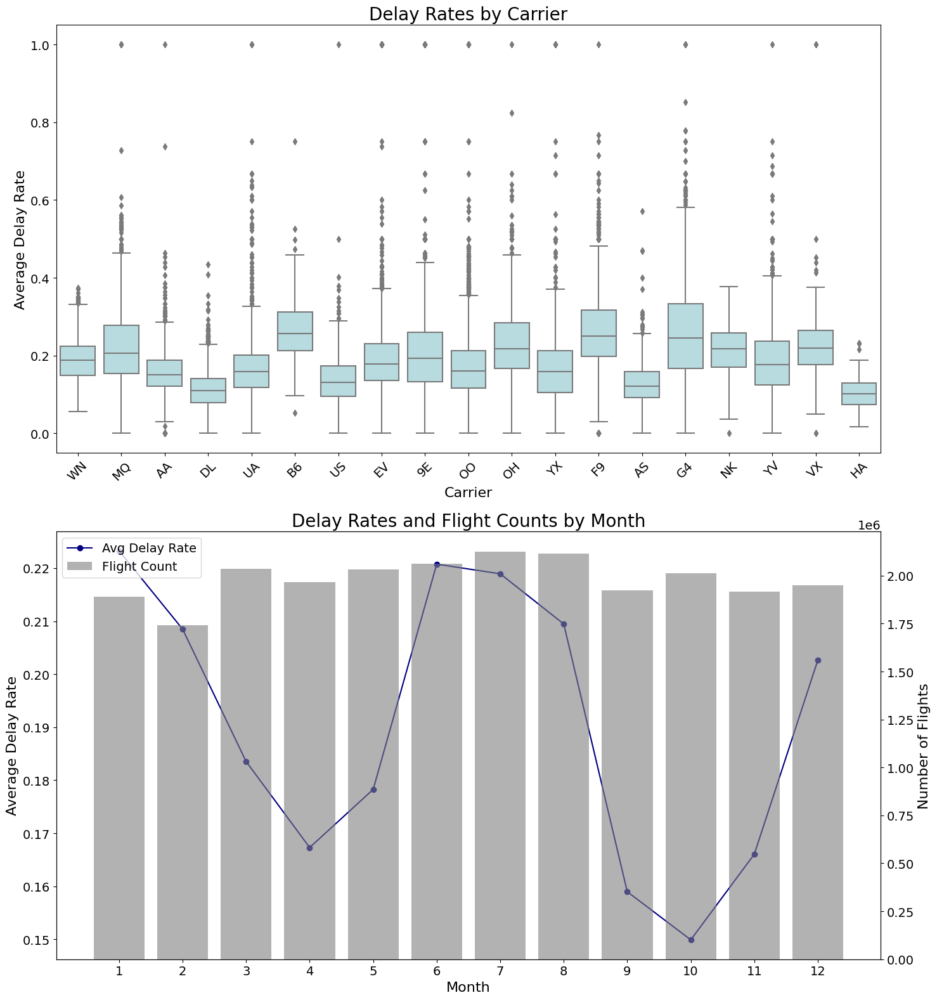

In [0]:

# Increase the default font size
plt.rcParams.update({'font.size': 14})


origin_airport_delays = eda_data.groupBy("ORIGIN_AIRPORT_ID").agg(F.avg("DEP_DEL15").alias("avg_delay_rate")).orderBy(F.desc("avg_delay_rate"))

agg_data = eda_data.groupBy('OP_CARRIER', 'ORIGIN_AIRPORT_ID', 'MONTH') \
             .agg(F.avg('DEP_DEL15').alias('avg_delay_rate')) \
             .toPandas()

# Create a figure with subplots
fig, (ax1, ax3) = plt.subplots(2, 1, figsize=(15, 16))

# 1. Box plot for Carriers
sns.boxplot(x='OP_CARRIER', y='avg_delay_rate', data=agg_data, ax=ax1, color='powderblue')
ax1.set_title('Delay Rates by Carrier', fontsize=20)
ax1.set_xlabel('Carrier', fontsize=16)
ax1.set_ylabel('Average Delay Rate', fontsize=16)
ax1.tick_params(axis='both', which='major', labelsize=14)
ax1.tick_params(axis='x', rotation=45)

# 3. Line plot for Months
flight_counts = df.groupBy("MONTH").count().toPandas()
flight_counts = flight_counts.sort_values('MONTH')
month_means = agg_data.groupby('MONTH')['avg_delay_rate'].mean()

ax3_twin = ax3.twinx()

bars = ax3_twin.bar(flight_counts['MONTH'], flight_counts['count'], alpha=0.6, color='grey')
ax3_twin.set_ylabel('Number of Flights', color='black', fontsize=16)
ax3_twin.tick_params(axis='y', labelcolor='black', labelsize=14)

line = ax3.plot(month_means.index, month_means.values, color='navy', marker='o')
ax3.set_ylabel('Average Delay Rate', color='black', fontsize=16)
ax3.tick_params(axis='y', labelcolor='black', labelsize=14)

ax3.set_title('Delay Rates and Flight Counts by Month', fontsize=20)
ax3.set_xlabel('Month', fontsize=16)
ax3.set_xticks(range(1, 13))
ax3.tick_params(axis='x', labelsize=14)

ax3.legend([line[0], bars], ['Avg Delay Rate', 'Flight Count'], loc='upper left', fontsize=14)

plt.tight_layout()
plt.show()

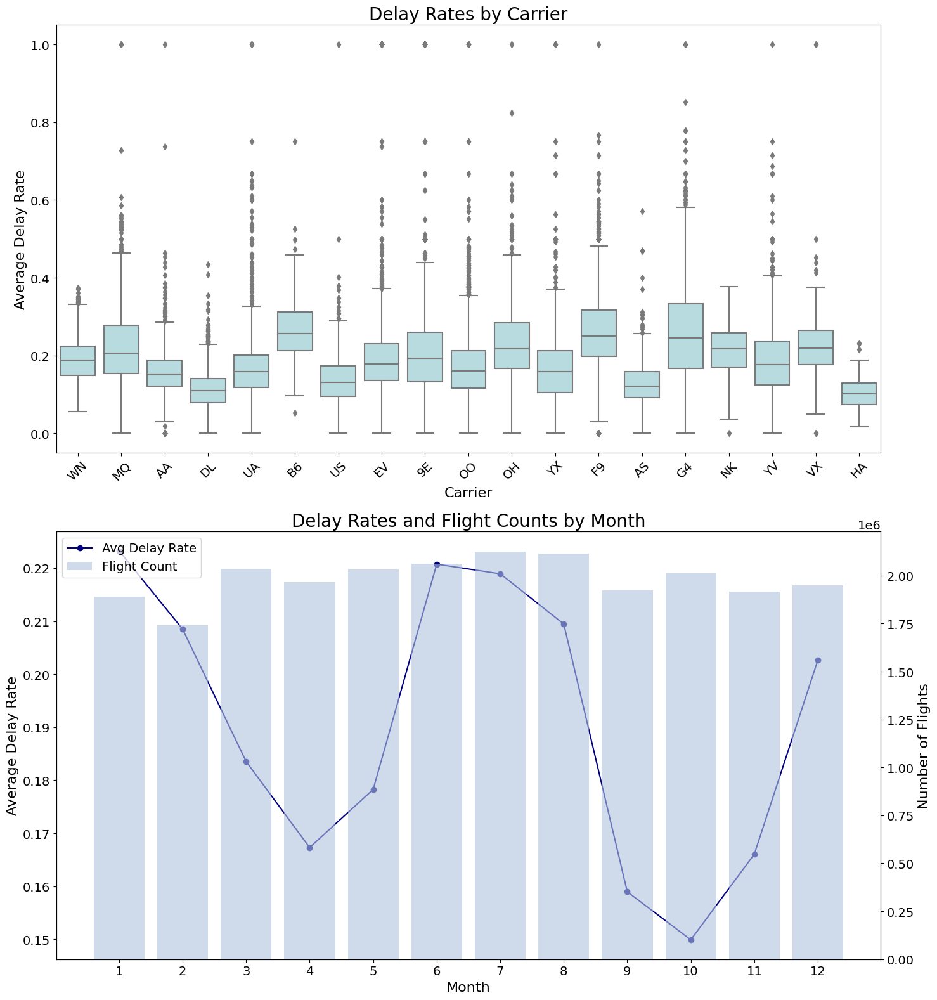

In [0]:

# Increase the default font size
plt.rcParams.update({'font.size': 14})


origin_airport_delays = eda_data.groupBy("ORIGIN_AIRPORT_ID").agg(F.avg("DEP_DEL15").alias("avg_delay_rate")).orderBy(F.desc("avg_delay_rate"))

agg_data = eda_data.groupBy('OP_CARRIER', 'ORIGIN_AIRPORT_ID', 'MONTH') \
             .agg(F.avg('DEP_DEL15').alias('avg_delay_rate')) \
             .toPandas()

# Create a figure with subplots
fig, (ax1, ax3) = plt.subplots(2, 1, figsize=(15, 16))

# 1. Box plot for Carriers
sns.boxplot(x='OP_CARRIER', y='avg_delay_rate', data=agg_data, ax=ax1, color='powderblue')
ax1.set_title('Delay Rates by Carrier', fontsize=20)
ax1.set_xlabel('Carrier', fontsize=16)
ax1.set_ylabel('Average Delay Rate', fontsize=16)
ax1.tick_params(axis='both', which='major', labelsize=14)
ax1.tick_params(axis='x', rotation=45)

# 3. Line plot for Months
flight_counts = df.groupBy("MONTH").count().toPandas()
flight_counts = flight_counts.sort_values('MONTH')
month_means = agg_data.groupby('MONTH')['avg_delay_rate'].mean()

ax3_twin = ax3.twinx()

bars = ax3_twin.bar(flight_counts['MONTH'], flight_counts['count'], alpha=0.6, color='lightsteelblue')
ax3_twin.set_ylabel('Number of Flights', color='black', fontsize=16)
ax3_twin.tick_params(axis='y', labelcolor='black', labelsize=14)

line = ax3.plot(month_means.index, month_means.values, color='navy', marker='o')
ax3.set_ylabel('Average Delay Rate', color='black', fontsize=16)
ax3.tick_params(axis='y', labelcolor='black', labelsize=14)

ax3.set_title('Delay Rates and Flight Counts by Month', fontsize=20)
ax3.set_xlabel('Month', fontsize=16)
ax3.set_xticks(range(1, 13))
ax3.tick_params(axis='x', labelsize=14)

ax3.legend([line[0], bars], ['Avg Delay Rate', 'Flight Count'], loc='upper left', fontsize=14)

plt.tight_layout()
plt.show()

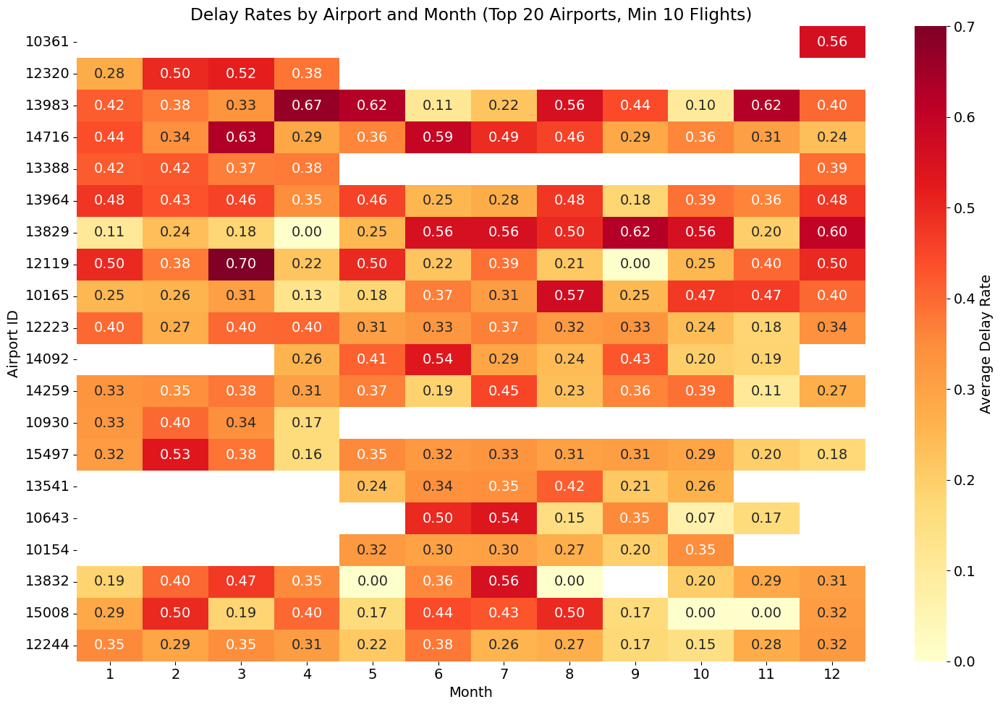

Worst Airport-Month Combinations (Airports with at least 10 flights):
      ORIGIN_AIRPORT_ID  MONTH  avg_delay_rate  flight_count
364               12119      3        0.700000            10
4005              13983      4        0.666667             9
1732              14716      3        0.630769            65
3043              13983     11        0.625000             8
1702              13983      5        0.625000             8
1669              13829      9        0.625000             8
4001              13829     12        0.600000            10
2393              14716      6        0.594203            69
1740              10165      8        0.571429            35
3491              10361     12        0.560000            25


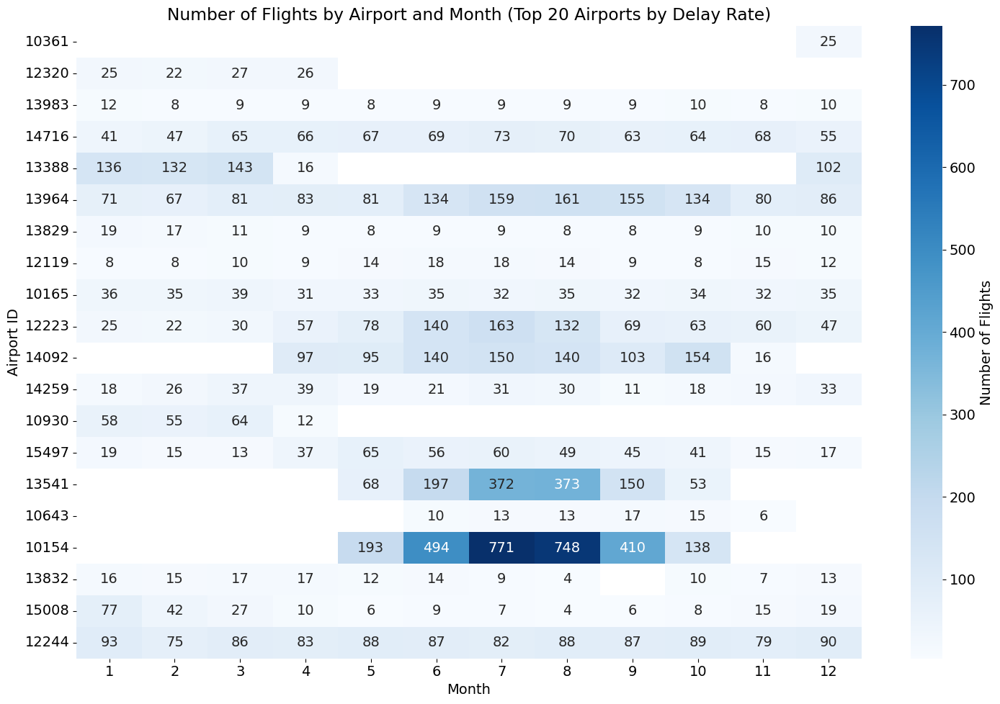

In [0]:
# There seems to be more of an issue with smaller airports, which makes sense


# First, let's filter out airports with less than 10 flights
airport_flight_counts = df.groupBy('ORIGIN_AIRPORT_ID').count().filter(F.col('count') >= 10)
valid_airports = airport_flight_counts.select('ORIGIN_AIRPORT_ID').rdd.flatMap(lambda x: x).collect()

# aggregate data for airports and months, only for valid airports
airport_month_delays = df.filter(F.col('ORIGIN_AIRPORT_ID').isin(valid_airports)) \
  .groupBy('ORIGIN_AIRPORT_ID', 'MONTH') \
  .agg(F.avg('DEP_DEL15').alias('avg_delay_rate'),
      F.count('*').alias('flight_count')) \
  .toPandas()

# Pivot the data to create a matrix suitable for a heatmap
delay_matrix = airport_month_delays.pivot(index='ORIGIN_AIRPORT_ID', 
  columns='MONTH', 
  values='avg_delay_rate')

# Sort airports by their average delay rate
airport_avg_delays = delay_matrix.mean(axis=1).sort_values(ascending=False)
delay_matrix = delay_matrix.loc[airport_avg_delays.index]

# Select top N airports for visibility (adjust as needed)
top_n = 20
delay_matrix_top = delay_matrix.head(top_n)

# Create the heatmap
plt.figure(figsize=(15, 10))
sns.heatmap(delay_matrix_top, cmap='YlOrRd', annot=True, fmt='.2f', cbar_kws={'label': 'Average Delay Rate'})

plt.title(f'Delay Rates by Airport and Month (Top {top_n} Airports, Min 10 Flights)')
plt.xlabel('Month')
plt.ylabel('Airport ID')

plt.tight_layout()
plt.show()

# Find the worst airport-month combinations
worst_combinations = airport_month_delays.sort_values('avg_delay_rate', ascending=False).head(10)
print("Worst Airport-Month Combinations (Airports with at least 10 flights):")
print(worst_combinations)

# Optional: Create a heatmap for flight counts
flight_count_matrix = airport_month_delays.pivot(index='ORIGIN_AIRPORT_ID', 
  columns='MONTH', 
  values='flight_count')
flight_count_matrix = flight_count_matrix.loc[airport_avg_delays.index]  # Use the same order as delay_matrix

plt.figure(figsize=(15, 10))
sns.heatmap(flight_count_matrix.head(top_n), cmap='Blues', annot=True, fmt='.0f', cbar_kws={'label': 'Number of Flights'})

plt.title(f'Number of Flights by Airport and Month (Top {top_n} Airports by Delay Rate)')
plt.xlabel('Month')
plt.ylabel('Airport ID')

plt.tight_layout()
plt.show()

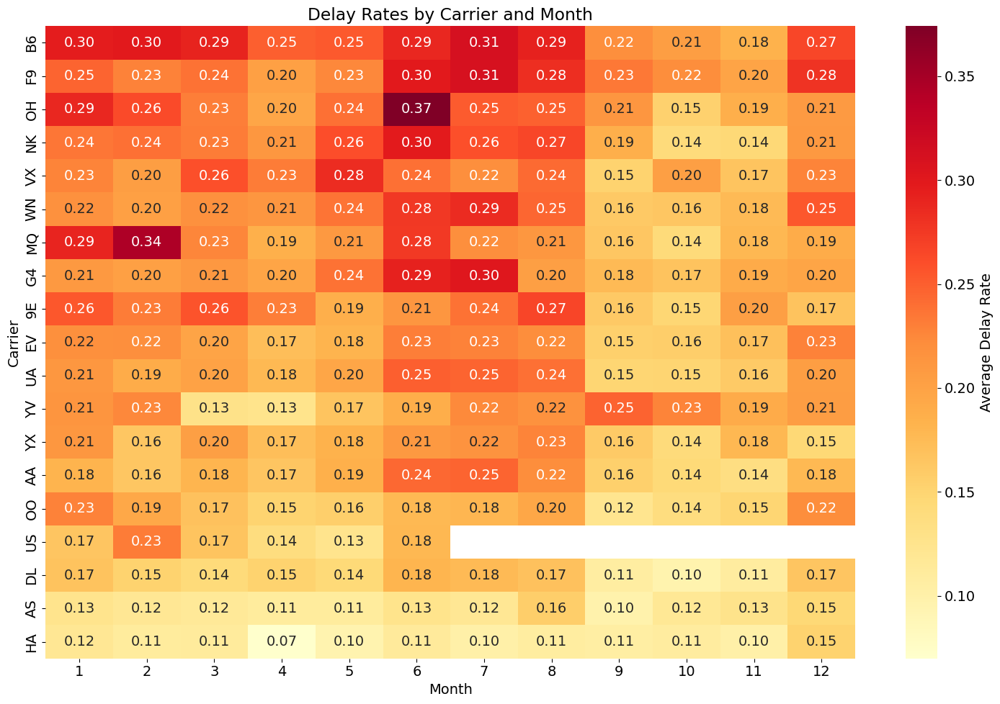

Worst Carrier-Month Combinations:
    OP_CARRIER  MONTH  avg_delay_rate  flight_count
79          OH      6        0.374104         23710
202         MQ      2        0.344515         47577
196         B6      7        0.311221         96764
37          F9      7        0.311061         37057
54          G4      7        0.302522         10310
199         F9      6        0.298904         34931
131         B6      2        0.298776         82684
156         NK      6        0.297948         49861
190         B6      1        0.295790         89621
158         B6      8        0.292941         96422


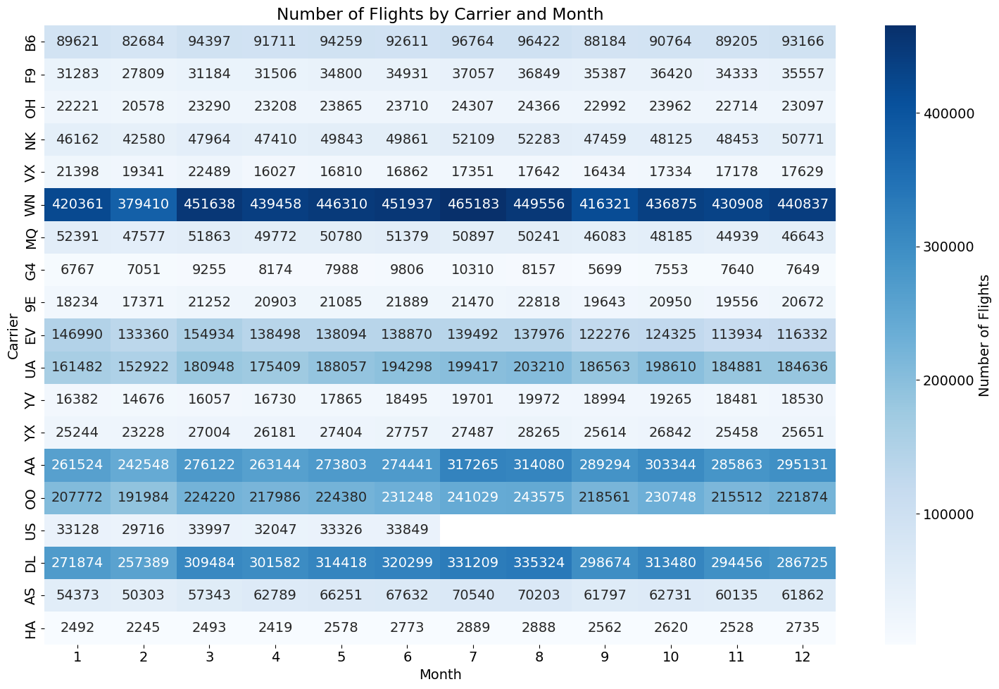

In [0]:


# Aggregate data for carriers and months
carrier_month_delays = df.groupBy('OP_CARRIER', 'MONTH') \
                         .agg(F.avg('DEP_DEL15').alias('avg_delay_rate'),
                              F.count('*').alias('flight_count')) \
                         .toPandas()

# Pivot the data to create a matrix suitable for a heatmap
delay_matrix = carrier_month_delays.pivot(index='OP_CARRIER', 
                                          columns='MONTH', 
                                          values='avg_delay_rate')

# Sort carriers by their average delay rate
carrier_avg_delays = delay_matrix.mean(axis=1).sort_values(ascending=False)
delay_matrix = delay_matrix.loc[carrier_avg_delays.index]

# Create the heatmap
plt.figure(figsize=(15, 10))
sns.heatmap(delay_matrix, cmap='YlOrRd', annot=True, fmt='.2f', cbar_kws={'label': 'Average Delay Rate'})

plt.title('Delay Rates by Carrier and Month')
plt.xlabel('Month')
plt.ylabel('Carrier')

plt.tight_layout()
plt.show()

# Find the worst carrier-month combinations
worst_combinations = carrier_month_delays.sort_values('avg_delay_rate', ascending=False).head(10)
print("Worst Carrier-Month Combinations:")
print(worst_combinations)

# Optional: Create a heatmap for flight counts
flight_count_matrix = carrier_month_delays.pivot(index='OP_CARRIER', 
                                                 columns='MONTH', 
                                                 values='flight_count')
flight_count_matrix = flight_count_matrix.loc[carrier_avg_delays.index]  # Use the same order as delay_matrix

plt.figure(figsize=(15, 10))
sns.heatmap(flight_count_matrix, cmap='Blues', annot=True, fmt='.0f', cbar_kws={'label': 'Number of Flights'})

plt.title('Number of Flights by Carrier and Month')
plt.xlabel('Month')
plt.ylabel('Carrier')

plt.tight_layout()
plt.show()

## Holidays Feature

In [0]:
holidays = [# New Years
            "2015-01-01", "2016-01-01", "2017-01-01", "2018-01-01", "2019-01-01", "2020-01-01", "2021-01-01",
            # MLK Day 
            "2015-01-19", "2016-01-18", "2017-01-16", "2018-01-15", "2019-01-21", "2020-01-20", "2021-01-18",
            # President's Day
            "2015-02-16", "2016-02-15", "2017-02-20", "2018-02-19", "2019-02-18", "2020-02-17", "2021-02-15",
            # Memorial Day 
            # Juneteeth became holiday in 2021 (skip)
            # Independence Day 
            "2015-07-04", "2016-07-04", "2017-07-04", "2018-07-04", "2019-07-04", "2020-07-04", "2021-07-04",
            # Labor Day
            "2015-09-07", "2016-09-05", "2017-09-04", "2018-09-03", "2019-09-02", "2020-09-07", "2021-09-06",
            # Columbus Day 
            "2015-10-12", "2016-10-10", "2017-10-09", "2018-10-08", "2019-10-14", "2020-10-12", "2021-10-11", 
            # Veterans Day
            "2015-11-11", "2016-11-11", "2017-11-11", "2018-11-11", "2019-11-11", "2020-11-11", "2021-11-11",
            # Thanksgiving Day 
            "2015-11-26", "2016-11-24", "2017-11-23", "2018-11-22", "2019-11-28", "2020-11-26", "2021-11-25",
            # Christmas Day
            "2015-12-25", "2016-12-25", "2017-12-25", "2018-12-25", "2019-12-25", "2020-12-25", "2021-12-25"
            ]
# Convert to date 
holiday_dates = [datetime.strptime(date, "%Y-%m-%d") for date in holidays]
# Get all days within 3 days of a holiday date 
all_dates = []
for date in holiday_dates:
    start_date = date - timedelta(days=3)
    end_date = date + timedelta(days=3)
    current_date = start_date
    while current_date <= end_date:
        all_dates.append(current_date.strftime("%Y-%m-%d"))
        current_date += timedelta(days=1)


In [0]:
# Create binary indicator if flight date is scheduled within 3 days of a holiday 
eda_data = eda_data.withColumn("DATE", col("FL_DATE").cast("string").substr(0, 10)).withColumn("HOLIDAY", when(col("DATE").isin(all_dates), 1).otherwise(0)).drop("DATE")

In [0]:
from pyspark.mllib.stat import Statistics

# Convert DataFrame columns to RDD of tuples
rdd = eda_data.select("HOLIDAY", "DEP_DEL15").rdd.map(lambda row: (float(row[0]), float(row[1])))

# Calculate Spearman correlation
spearman_corr = Statistics.corr(rdd, method="spearman")

print(f"Spearman's correlation between HOLIDAY and DEP_DEL15: {spearman_corr}")

Spearman's correlation between HOLIDAY and DEP_DEL15: [[ 1.         -0.02478806]
 [-0.02478806  1.        ]]


In [0]:
from pyspark.sql.functions import col, count, sum

delay_proportions = (
    eda_data
    .groupBy("HOLIDAY")
    .agg(
        count("*").alias("total_flights"),
        sum(col("DEP_DEL15").cast("int")).alias("delayed_flights"),
        (sum(col("DEP_DEL15").cast("int")) / count("*") * 100).alias("delay_percentage")
    )
    .orderBy("HOLIDAY")
)

delay_proportions.show()

+-------+-------------+---------------+------------------+
|HOLIDAY|total_flights|delayed_flights|  delay_percentage|
+-------+-------------+---------------+------------------+
|      0|     19811169|        3842617|19.396215336914242|
|      1|      3955399|         772789|19.537573832627253|
+-------+-------------+---------------+------------------+



In [0]:
eda_data.schema

StructType([StructField('index', IntegerType(), True), StructField('MONTH', IntegerType(), True), StructField('DAY_OF_WEEK', IntegerType(), True), StructField('OP_CARRIER', StringType(), True), StructField('ORIGIN_AIRPORT_ID', IntegerType(), True), StructField('CRS_DEP_TIME', IntegerType(), True), StructField('DISTANCE', DoubleType(), True), StructField('DEP_DEL15', DoubleType(), True), StructField('QUARTER', IntegerType(), True), StructField('DEP_DELAY', DoubleType(), True), StructField('DEST_AIRPORT_ID', IntegerType(), True), StructField('FL_DATE', StringType(), True), StructField('TAIL_NUM', StringType(), True), StructField('ARR_TIME', IntegerType(), True), StructField('ARR_DELAY', DoubleType(), True), StructField('ARR_DEL15', DoubleType(), True), StructField('CANCELLED', DoubleType(), True), StructField('type', StringType(), True), StructField('ELEVATION', FloatType(), True), StructField('HourlyAltimeterSetting', FloatType(), True), StructField('HourlyDryBulbTemperature', FloatType

In [0]:

# Check holiday impact on average delay rate
holiday_impact = eda_data.groupBy("HOLIDAY").agg(F.avg("DEP_DEL15").alias("avg_delay_rate"))

holiday_impact.show()




+-------+-------------------+
|HOLIDAY|     avg_delay_rate|
+-------+-------------------+
|      1|0.19537573832627253|
|      0|0.19396215336914244|
+-------+-------------------+



In [0]:
correlation = eda_data.stat.corr("HOLIDAY", "DEP_DEL15")
print(f"Correlation between HOLIDAY and DEP_DEL15: {correlation}")

# Create a contingency table
contingency = eda_data.crosstab("HOLIDAY", "DEP_DEL15")
contingency.show()

Correlation between HOLIDAY and DEP_DEL15: 0.0013309740736903099
+-----------------+--------+-------+
|HOLIDAY_DEP_DEL15|     0.0|    1.0|
+-----------------+--------+-------+
|                0|15968552|3842617|
|                1| 3182610| 772789|
+-----------------+--------+-------+



In [0]:
holidays = [# New Years
            "2015-01-01", "2016-01-01", "2017-01-01", "2018-01-01", "2019-01-01", "2020-01-01", "2021-01-01",
            # MLK Day 
            "2015-01-19", "2016-01-18", "2017-01-16", "2018-01-15", "2019-01-21", "2020-01-20", "2021-01-18",
            # President's Day
            "2015-02-16", "2016-02-15", "2017-02-20", "2018-02-19", "2019-02-18", "2020-02-17", "2021-02-15",
            # Memorial Day 
            # Juneteeth became holiday in 2021 (skip)
            # Independence Day 
            "2015-07-04", "2016-07-04", "2017-07-04", "2018-07-04", "2019-07-04", "2020-07-04", "2021-07-04",
            # Labor Day
            "2015-09-07", "2016-09-05", "2017-09-04", "2018-09-03", "2019-09-02", "2020-09-07", "2021-09-06",
            # Columbus Day 
            "2015-10-12", "2016-10-10", "2017-10-09", "2018-10-08", "2019-10-14", "2020-10-12", "2021-10-11", 
            # Veterans Day
            "2015-11-11", "2016-11-11", "2017-11-11", "2018-11-11", "2019-11-11", "2020-11-11", "2021-11-11",
            # Thanksgiving Day 
            "2015-11-26", "2016-11-24", "2017-11-23", "2018-11-22", "2019-11-28", "2020-11-26", "2021-11-25",
            # Christmas Day
            "2015-12-25", "2016-12-25", "2017-12-25", "2018-12-25", "2019-12-25", "2020-12-25", "2021-12-25"
            ]
# Convert to date 
holiday_dates = [datetime.strptime(date, "%Y-%m-%d") for date in holidays]
# Get all days within 3 days of a holiday date 
all_dates = []
for date in holiday_dates:
    start_date = date - timedelta(days=1)
    end_date = date + timedelta(days=1)
    current_date = start_date
    while current_date <= end_date:
        all_dates.append(current_date.strftime("%Y-%m-%d"))
        current_date += timedelta(days=1)

In [0]:
# Create binary indicator if flight date is scheduled within 3 days of a holiday 
eda_data = eda_data.withColumn("DATE", col("FL_DATE").cast("string").substr(0, 10)).withColumn("HOLIDAY", when(col("DATE").isin(all_dates), 1).otherwise(0)).drop("DATE")

In [0]:
# Check holiday impact on average delay rate
holiday_impact = eda_data.groupBy("HOLIDAY").agg(F.avg("DEP_DEL15").alias("avg_delay_rate"))

holiday_impact.show()

+-------+-------------------+
|HOLIDAY|     avg_delay_rate|
+-------+-------------------+
|      1|0.17680285898469766|
|      0|0.19547984924999978|
+-------+-------------------+

